<a href="https://colab.research.google.com/github/msemihyasa/Semih/blob/main/244329037_Mehmet_Semih_Yasa_Yapay_Sinir_Aglari_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ÜSKÜDAR ÜNİVERSİTESİ
## Yapay Sinir Ağları Dersi - Final Ödevi

**Konu:** ISIC 2018 Deri Lezyonu Görüntülerinde İkili Sınıflandırma (Binary Classification)

**Amaç:** Ham (raw) görüntüler üzerinde uçtan uca bir Deep Learning pipeline kurup:
1. Scratch CNN
2. MobileNetV2 Transfer Learning
3. EfficientNetB0 Transfer Learning

modellerini eğitmek, testte karşılaştırmak ve Grad-CAM ile açıklanabilirlik sunmak.

---

## Kütüphanelerin Yüklenmesi

In [1]:
# Temel kütüphaneler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
import random
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# TensorFlow / Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications import MobileNetV2, EfficientNetB0
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess

# Sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, confusion_matrix, accuracy_score,
    precision_score, recall_score, f1_score, roc_auc_score, roc_curve,
    precision_recall_curve, average_precision_score
)
from sklearn.utils.class_weight import compute_class_weight

# OpenCV for image processing
import cv2

# Reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

print(f"TensorFlow Version: {tf.__version__}")
print(f"GPU Available: {tf.config.list_physical_devices('GPU')}")


from google.colab import drive
drive.mount('/content/drive')

TensorFlow Version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Mounted at /content/drive


## Konfigürasyon

In [2]:
# --- CONFIGURATION ---
DATA_DIR = "/content/drive/MyDrive/data/Skin cancer ISIC The International Skin Imaging Collaboration"
OUTPUT_DIR = "output_results"

# Model parametreleri
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 100
INITIAL_LR = 1e-3
FINE_TUNE_LR = 1e-5

# Split oranları
TEST_SPLIT = 0.15
VAL_SPLIT = 0.15  # Train'in içinden

if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

print(f"Veri Dizini: {DATA_DIR}")
print(f"Çıktı Dizini: {OUTPUT_DIR}")
print(f"Görüntü Boyutu: {IMG_SIZE}")
print(f"Batch Size: {BATCH_SIZE}")

Veri Dizini: /content/drive/MyDrive/data/Skin cancer ISIC The International Skin Imaging Collaboration
Çıktı Dizini: output_results
Görüntü Boyutu: (224, 224)
Batch Size: 32


---
# BÖLÜM 1: VERİ SETİ VE SINIF SEÇİMİ

## 1.1 Veri Setinin Yüklenmesi ve Sınıf Dağılımı

In [3]:
def load_dataset_info(data_dir):
    """Veri setindeki tüm görüntüleri ve sınıf bilgilerini yükler."""
    all_images = []
    all_labels = []

    for data_split_name in os.listdir(data_dir):
        data_split_path = os.path.join(data_dir, data_split_name)
        if os.path.isdir(data_split_path):
            sub_dirs = [d for d in os.listdir(data_split_path) if os.path.isdir(os.path.join(data_split_path, d))]
            if sub_dirs:
                for class_name in sub_dirs:
                    class_dir = os.path.join(data_split_path, class_name)
                    images = glob.glob(os.path.join(class_dir, "*.jpg")) + glob.glob(os.path.join(class_dir, "*.png"))
                    for img_path in images:
                        all_images.append(img_path)
                        all_labels.append(class_name)
            else:
                class_name = data_split_name
                images = glob.glob(os.path.join(data_split_path, "*.jpg")) + glob.glob(os.path.join(data_split_path, "*.png"))
                for img_path in images:
                    all_images.append(img_path)
                    all_labels.append(class_name)

    return all_images, all_labels

# Veri setini yükle
all_images, all_labels = load_dataset_info(DATA_DIR)

# DataFrame oluştur
df_all = pd.DataFrame({
    'image_path': all_images,
    'class': all_labels
})

print("=" * 60)
print("VERİ SETİ SINIF DAĞILIMI")
print("=" * 60)
print(f"\nToplam görüntü sayısı: {len(df_all)}")
print(f"\nSınıf dağılımı (value_counts()):")
class_counts = df_all['class'].value_counts()
print(class_counts)


VERİ SETİ SINIF DAĞILIMI

Toplam görüntü sayısı: 2357

Sınıf dağılımı (value_counts()):
class
pigmented benign keratosis    478
melanoma                      454
basal cell carcinoma          392
nevus                         373
squamous cell carcinoma       197
vascular lesion               142
actinic keratosis             130
dermatofibroma                111
seborrheic keratosis           80
Name: count, dtype: int64


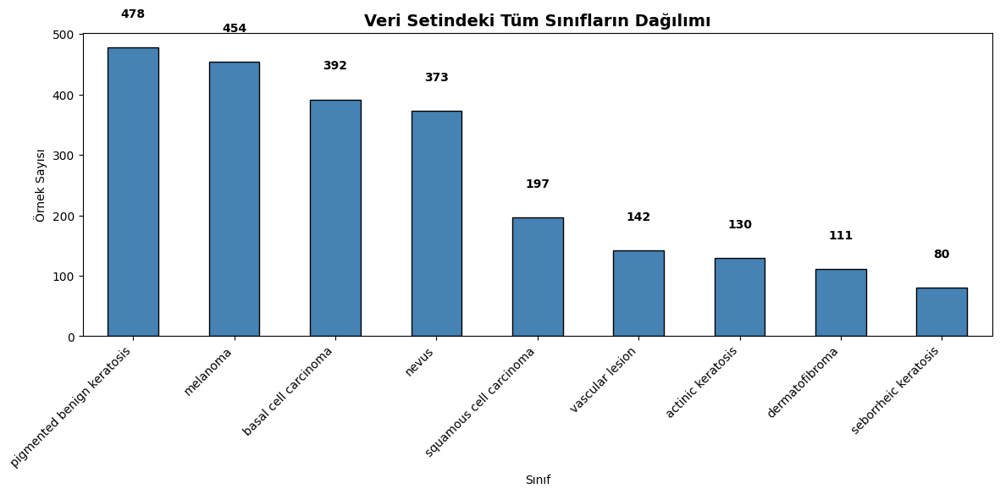

In [4]:
# Sınıf dağılımı görselleştirmesi
plt.figure(figsize=(12, 6))
ax = class_counts.plot(kind='bar', color='steelblue', edgecolor='black')
plt.title('Veri Setindeki Tüm Sınıfların Dağılımı', fontsize=14, fontweight='bold')
plt.xlabel('Sınıf')
plt.ylabel('Örnek Sayısı')
plt.xticks(rotation=45, ha='right')

# Her çubuğun üstüne sayı ekle
for i, v in enumerate(class_counts.values):
    ax.text(i, v + 50, str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "all_class_distribution.png"), dpi=150)
plt.show()

## 1.2 En Yüksek Örnek Sayısına Sahip İlk İki Sınıfın Seçimi

In [5]:
# En yüksek örnek sayısına sahip ilk 2 sınıfı seç
top_2_classes = class_counts.head(2).index.tolist()
CLASS_A = top_2_classes[0]  # En büyük sınıf
CLASS_B = top_2_classes[1]  # İkinci büyük sınıf

print("=" * 60)
print("SEÇİLEN İKİ SINIF (Binary Classification)")
print("=" * 60)
print(f"\nSınıf A (Label=0): {CLASS_A}")
print(f"  Örnek sayısı: {class_counts[CLASS_A]}")
print(f"\nSınıf B (Label=1): {CLASS_B}")
print(f"  Örnek sayısı: {class_counts[CLASS_B]}")
print(f"\nToplam kullanılacak görüntü: {class_counts[CLASS_A] + class_counts[CLASS_B]}")

SEÇİLEN İKİ SINIF (Binary Classification)

Sınıf A (Label=0): pigmented benign keratosis
  Örnek sayısı: 478

Sınıf B (Label=1): melanoma
  Örnek sayısı: 454

Toplam kullanılacak görüntü: 932


In [6]:
# Sadece seçilen iki sınıfı filtrele
df_binary = df_all[df_all['class'].isin([CLASS_A, CLASS_B])].copy()

# Binary etiketleme: CLASS_A = 0, CLASS_B = 1
df_binary['label'] = df_binary['class'].map({CLASS_A: 0, CLASS_B: 1})

print(f"\nBinary veri seti boyutu: {len(df_binary)}")
print(f"\nLabel dağılımı:")
print(df_binary['label'].value_counts())


Binary veri seti boyutu: 932

Label dağılımı:
label
0    478
1    454
Name: count, dtype: int64


In [7]:
# Sınıf dengesizliği analizi
class_0_count = len(df_binary[df_binary['label'] == 0])
class_1_count = len(df_binary[df_binary['label'] == 1])
imbalance_ratio = max(class_0_count, class_1_count) / min(class_0_count, class_1_count)

print("\n" + "=" * 60)
print("SINIF DENGESİZLİĞİ ANALİZİ")
print("=" * 60)
print(f"\nSınıf 0 ({CLASS_A}): {class_0_count} örnek ({100*class_0_count/len(df_binary):.1f}%)")
print(f"Sınıf 1 ({CLASS_B}): {class_1_count} örnek ({100*class_1_count/len(df_binary):.1f}%)")
print(f"\nDengesizlik oranı: {imbalance_ratio:.2f}:1")

if imbalance_ratio > 1.5:
    print("\n⚠️ Sınıf dengesizliği mevcut! class_weight kullanılacak.")
    USE_CLASS_WEIGHT = True
else:
    print("\n✓ Sınıflar dengeli.")
    USE_CLASS_WEIGHT = False


SINIF DENGESİZLİĞİ ANALİZİ

Sınıf 0 (pigmented benign keratosis): 478 örnek (51.3%)
Sınıf 1 (melanoma): 454 örnek (48.7%)

Dengesizlik oranı: 1.05:1

✓ Sınıflar dengeli.


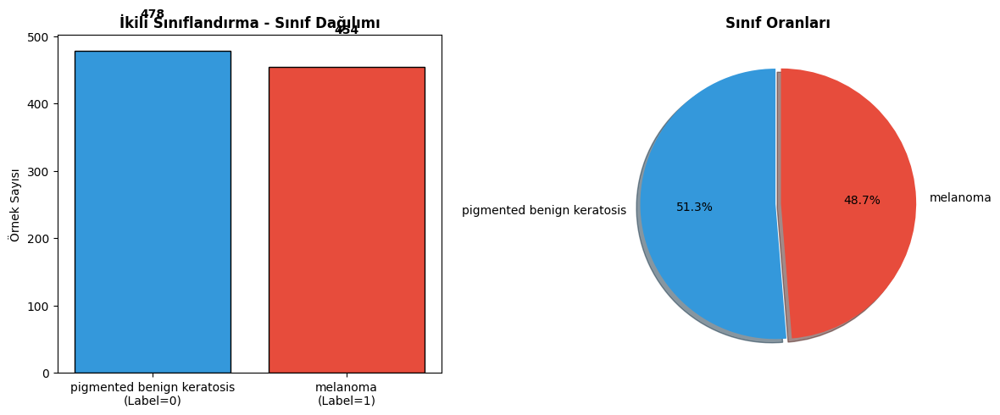

In [8]:
# Binary sınıf dağılımı görselleştirmesi
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Bar plot
colors = ['#3498db', '#e74c3c']
bars = axes[0].bar([f'{CLASS_A}\n(Label=0)', f'{CLASS_B}\n(Label=1)'],
                   [class_0_count, class_1_count], color=colors, edgecolor='black')
axes[0].set_title('İkili Sınıflandırma - Sınıf Dağılımı', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Örnek Sayısı')
for bar, count in zip(bars, [class_0_count, class_1_count]):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50,
                 str(count), ha='center', fontweight='bold')

# Pie chart
axes[1].pie([class_0_count, class_1_count], labels=[f'{CLASS_A}', f'{CLASS_B}'],
            autopct='%1.1f%%', colors=colors, explode=[0.02, 0.02],
            shadow=True, startangle=90)
axes[1].set_title('Sınıf Oranları', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "binary_class_distribution.png"), dpi=150)
plt.show()

### Bölüm 1 - Yorum

**Seçilen Sınıflar:**
- Veri setindeki tüm sınıfların örnek sayıları incelendi
- En yüksek örnek sayısına sahip ilk iki sınıf binary classification için seçildi
- Bu seçim, modellerin yeterli veri ile eğitilmesini sağlar

**Sınıf Dengesizliği:**
- Eğer dengesizlik oranı 1.5'ten büyükse, class_weight kullanılacak
- Bu, modelin azınlık sınıfını da iyi öğrenmesini sağlar

---
# BÖLÜM 2: VERİ BÖLME (Train / Validation / Test)

Stratified split ile sınıf oranları korunacak.

In [9]:
# Önce Train+Val ve Test olarak ayır
X = df_binary['image_path'].values
y = df_binary['label'].values

X_train_val, X_test, y_train_val, y_test = train_test_split(
    X, y, test_size=TEST_SPLIT, stratify=y, random_state=SEED
)

# Train+Val'ı Train ve Val olarak ayır
# Val oranı: 0.15 / 0.85 ≈ 0.176
val_ratio = VAL_SPLIT / (1 - TEST_SPLIT)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_val, y_train_val, test_size=val_ratio, stratify=y_train_val, random_state=SEED
)

print("=" * 60)
print("VERİ BÖLME (Stratified Split)")
print("=" * 60)
print(f"\nToplam veri: {len(df_binary)}")
print(f"\nBölme oranları: %70 Train / %15 Validation / %15 Test")
print(f"\nTrain seti: {len(X_train)} görüntü ({100*len(X_train)/len(df_binary):.1f}%)")
print(f"Validation seti: {len(X_val)} görüntü ({100*len(X_val)/len(df_binary):.1f}%)")
print(f"Test seti: {len(X_test)} görüntü ({100*len(X_test)/len(df_binary):.1f}%)")

VERİ BÖLME (Stratified Split)

Toplam veri: 932

Bölme oranları: %70 Train / %15 Validation / %15 Test

Train seti: 652 görüntü (70.0%)
Validation seti: 140 görüntü (15.0%)
Test seti: 140 görüntü (15.0%)


In [10]:
# Her split için sınıf dağılımları
def get_class_distribution(y, class_a_name, class_b_name):
    unique, counts = np.unique(y, return_counts=True)
    dist = dict(zip(unique, counts))
    return {
        f'{class_a_name} (0)': dist.get(0, 0),
        f'{class_b_name} (1)': dist.get(1, 0)
    }

train_dist = get_class_distribution(y_train, CLASS_A, CLASS_B)
val_dist = get_class_distribution(y_val, CLASS_A, CLASS_B)
test_dist = get_class_distribution(y_test, CLASS_A, CLASS_B)

# Dağılım tablosu
dist_table = pd.DataFrame({
    'Split': ['Train', 'Validation', 'Test'],
    'Toplam': [len(y_train), len(y_val), len(y_test)],
    f'{CLASS_A} (0)': [train_dist[f'{CLASS_A} (0)'], val_dist[f'{CLASS_A} (0)'], test_dist[f'{CLASS_A} (0)']],
    f'{CLASS_B} (1)': [train_dist[f'{CLASS_B} (1)'], val_dist[f'{CLASS_B} (1)'], test_dist[f'{CLASS_B} (1)']]
})

print("\nSınıf Dağılımları (Tablo):")
print(dist_table.to_string(index=False))


Sınıf Dağılımları (Tablo):
     Split  Toplam  pigmented benign keratosis (0)  melanoma (1)
     Train     652                             334           318
Validation     140                              72            68
      Test     140                              72            68


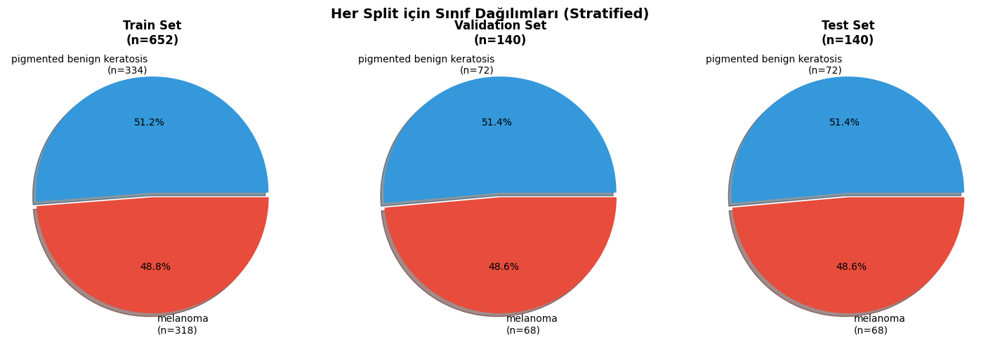

In [11]:
# Görselleştirme
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

splits = ['Train', 'Validation', 'Test']
distributions = [train_dist, val_dist, test_dist]
totals = [len(y_train), len(y_val), len(y_test)]

for ax, split, dist, total in zip(axes, splits, distributions, totals):
    values = list(dist.values())
    labels = [f'{CLASS_A}\n(n={values[0]})', f'{CLASS_B}\n(n={values[1]})']
    ax.pie(values, labels=labels, autopct='%1.1f%%', colors=colors,
           explode=[0.02, 0.02], shadow=True)
    ax.set_title(f'{split} Set\n(n={total})', fontsize=12, fontweight='bold')

plt.suptitle('Her Split için Sınıf Dağılımları (Stratified)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "split_distributions.png"), dpi=150)
plt.show()

### Bölüm 2 - Yorum

**Veri Bölme Stratejisi:**
- **Oran:** %70 Train / %15 Validation / %15 Test
- **Stratified Split:** Sınıf oranları tüm setlerde korundu
- **Test seti:** Sadece final değerlendirme için kullanılacak
- **Validation seti:** EarlyStopping ve model seçimi için kullanılacak

---
# BÖLÜM 3: INPUT PIPELINE VE DATA AUGMENTATION

## 3.1 Input Pipeline (tf.data)

In [12]:
# Görüntü yükleme ve preprocessing fonksiyonu
def load_and_preprocess_image(image_path, label):
    """Görüntüyü yükler, resize eder ve normalize eder."""
    # Dosyayı oku
    img = tf.io.read_file(image_path)
    # Decode (JPEG/PNG)
    img = tf.image.decode_jpeg(img, channels=3)
    # Resize
    img = tf.image.resize(img, IMG_SIZE)
    # Normalize (0-255 -> 0-1)
    img = img / 255.0
    return img, label

# Dataset oluşturma fonksiyonu
def create_dataset(X, y, batch_size, shuffle=False, augment=False):
    """tf.data Dataset oluşturur."""
    dataset = tf.data.Dataset.from_tensor_slices((X, y))

    # Preprocessing
    dataset = dataset.map(load_and_preprocess_image,
                          num_parallel_calls=tf.data.AUTOTUNE)

    # Cache
    dataset = dataset.cache()

    # Shuffle (sadece train için)
    if shuffle:
        dataset = dataset.shuffle(buffer_size=1000, seed=SEED)

    # Augmentation (sadece train için)
    if augment:
        dataset = dataset.map(augment_image, num_parallel_calls=tf.data.AUTOTUNE)

    # Batch
    dataset = dataset.batch(batch_size)

    # Prefetch
    dataset = dataset.prefetch(tf.data.AUTOTUNE)

    return dataset

## 3.2 Data Augmentation (Sadece Train için)

In [13]:
# Data Augmentation fonksiyonu (tf.image kullanarak - unbatched veri için uygun)
def augment_image(image, label):
    """
    tf.image fonksiyonları ile augmentation uygular.
    Unbatched (3D tensor) veri ile çalışır.
    """
    # Random horizontal flip
    image = tf.image.random_flip_left_right(image)

    # Random vertical flip
    image = tf.image.random_flip_up_down(image)

    # Random brightness (±10%)
    image = tf.image.random_brightness(image, max_delta=0.1)

    # Random contrast (±10%)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)

    # Random saturation
    image = tf.image.random_saturation(image, lower=0.9, upper=1.1)

    # Random hue
    image = tf.image.random_hue(image, max_delta=0.05)

    # Değerleri [0, 1] aralığında tut
    image = tf.clip_by_value(image, 0.0, 1.0)

    return image, label

# Keras Sequential augmentation (model içinde kullanılacak - batched veri için)
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.1),  # ±18 derece
    layers.RandomZoom(0.1),      # ±10% zoom
    layers.RandomContrast(0.1),  # ±10% contrast
], name="data_augmentation")

print("Data Augmentation Parametreleri:")
print("-" * 40)
print("- RandomFlip: horizontal & vertical")
print("- RandomBrightness: ±10%")
print("- RandomContrast: ±10%")
print("- RandomSaturation: ±10%")
print("- RandomHue: ±5%")
print("\nNot: tf.image fonksiyonları kullanılıyor (unbatched veri uyumlu)")

Data Augmentation Parametreleri:
----------------------------------------
- RandomFlip: horizontal & vertical
- RandomBrightness: ±10%
- RandomContrast: ±10%
- RandomSaturation: ±10%
- RandomHue: ±5%

Not: tf.image fonksiyonları kullanılıyor (unbatched veri uyumlu)



Augmentation Örnekleri (6 Görüntü):


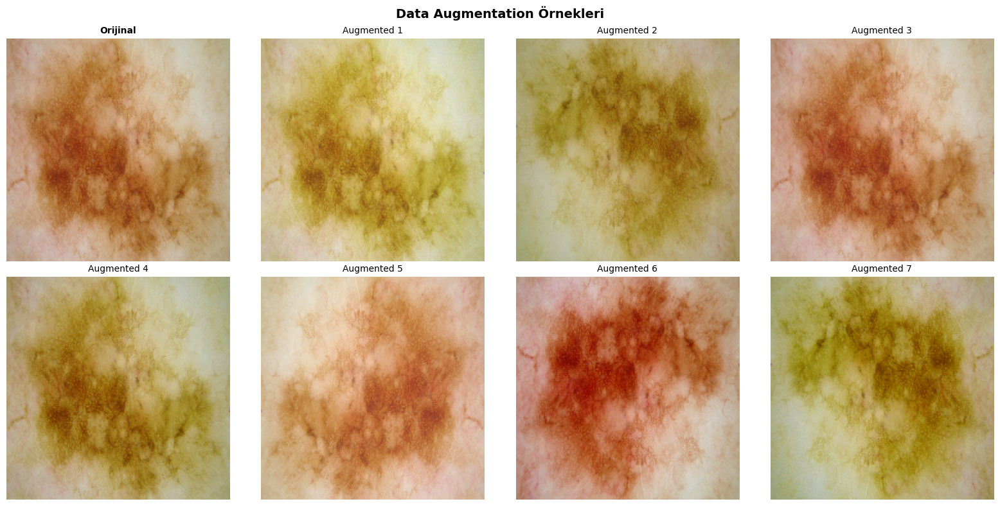

In [14]:
# Augmentation örneklerini görselleştir
print("\nAugmentation Örnekleri (6 Görüntü):")

# Örnek bir görüntü yükle
sample_path = X_train[0]
sample_img = load_img(sample_path, target_size=IMG_SIZE)
sample_array = img_to_array(sample_img) / 255.0

fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Orijinal
axes[0, 0].imshow(sample_array)
axes[0, 0].set_title('Orijinal', fontsize=10, fontweight='bold')
axes[0, 0].axis('off')

# 7 augmented versiyon
for i in range(7):
    row = (i + 1) // 4
    col = (i + 1) % 4
    # tf.image augmentation uygula
    aug_img, _ = augment_image(sample_array, 0)
    axes[row, col].imshow(aug_img.numpy())
    axes[row, col].set_title(f'Augmented {i+1}', fontsize=10)
    axes[row, col].axis('off')

plt.suptitle('Data Augmentation Örnekleri', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "augmentation_examples.png"), dpi=150)
plt.show()

In [15]:
# Dataset'leri oluştur
train_dataset = create_dataset(X_train, y_train, BATCH_SIZE, shuffle=True, augment=True)
val_dataset = create_dataset(X_val, y_val, BATCH_SIZE, shuffle=False, augment=False)
test_dataset = create_dataset(X_test, y_test, BATCH_SIZE, shuffle=False, augment=False)

print("Dataset'ler oluşturuldu:")
print(f"- Train: {len(X_train)} görüntü (augmentation + shuffle)")
print(f"- Validation: {len(X_val)} görüntü")
print(f"- Test: {len(X_test)} görüntü")

Dataset'ler oluşturuldu:
- Train: 652 görüntü (augmentation + shuffle)
- Validation: 140 görüntü
- Test: 140 görüntü


In [16]:
# Class weights hesapla (dengesizlik varsa)
if USE_CLASS_WEIGHT:
    class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
    class_weight_dict = {i: w for i, w in enumerate(class_weights)}
    print(f"\nClass Weights: {class_weight_dict}")
else:
    class_weight_dict = None
    print("\nClass weights kullanılmıyor (dengeli sınıflar).")


Class weights kullanılmıyor (dengeli sınıflar).


### Bölüm 3 - Yorum

**Input Pipeline:**
- `tf.data` API kullanıldı
- `cache()`: Veriyi bellekte tutar, tekrar okuma gerektirmez
- `prefetch()`: CPU ve GPU işlemlerini paralel yapar
- `num_parallel_calls=AUTOTUNE`: Otomatik paralellik optimizasyonu

**Data Augmentation:**
- Sadece train setine uygulandı (validation/test augment edilmedi)
- Makul medikal sınırlar içinde tutuldu
- Rotasyon, zoom, flip, brightness, contrast değişimleri
- Overfitting'i azaltmaya yardımcı olur

---
# BÖLÜM 4: MODEL-1 - SCRATCH CNN

## 4.1 Model Mimarisi

In [17]:
def create_scratch_cnn(input_shape=(224, 224, 3)):
    """
    Scratch CNN mimarisi oluşturur.

    Mimari:
    - 4 Convolutional Block (Conv + BN + ReLU + MaxPool + Dropout)
    - Global Average Pooling
    - Dense Head
    """
    inputs = layers.Input(shape=input_shape)
    x = inputs

    # Blok-1: 32 filtre
    x = layers.Conv2D(32, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(32, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.25)(x)

    # Blok-2: 64 filtre
    x = layers.Conv2D(64, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(64, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.25)(x)

    # Blok-3: 128 filtre
    x = layers.Conv2D(128, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(128, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.30)(x)

    # Blok-4: 256 filtre
    x = layers.Conv2D(256, (3, 3), padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.35)(x)

    # Head
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(1, activation='sigmoid')(x)

    model = models.Model(inputs, outputs, name='Scratch_CNN')
    return model

# Model oluştur
scratch_cnn = create_scratch_cnn()

# Model özeti
print("=" * 60)
print("MODEL-1: SCRATCH CNN MİMARİSİ")
print("=" * 60)
scratch_cnn.summary()

MODEL-1: SCRATCH CNN MİMARİSİ


Model: "Scratch_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 618,017 (2.36 MB)

 Trainable params: 616,609 (2.35 MB)

 Non-trainable params: 1,408 (5.50 KB)

## 4.2 Eğitim

In [23]:
# Callbacks
def get_callbacks(model_name):
    """Eğitim callback'lerini döndürür."""
    return [
        callbacks.EarlyStopping(
            monitor='val_loss',
            patience=10,
            restore_best_weights=True,
            verbose=1
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,
            patience=5,
            min_lr=1e-6,
            verbose=1
        ),
        callbacks.ModelCheckpoint(
            filepath=os.path.join(OUTPUT_DIR, f'{model_name}_best.keras'),
            monitor='val_loss',
            save_best_only=True,
            verbose=0
        )
    ]

In [24]:
# Scratch CNN'i derle
scratch_cnn.compile(
    optimizer=optimizers.Adam(learning_rate=INITIAL_LR),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

print("Scratch CNN Eğitim Başlıyor...")
print(f"- Optimizer: Adam (lr={INITIAL_LR})")
print(f"- Loss: BinaryCrossentropy")
print(f"- Max Epochs: {EPOCHS}")
print(f"- EarlyStopping: patience=10")

Scratch CNN Eğitim Başlıyor...
- Optimizer: Adam (lr=0.001)
- Loss: BinaryCrossentropy
- Max Epochs: 100
- EarlyStopping: patience=10


In [25]:
# Eğitim
history_scratch = scratch_cnn.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=get_callbacks('scratch_cnn'),
    class_weight=class_weight_dict,
    verbose=1
)

Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 26s 586ms/step - accuracy: 0.8419 - loss: 0.3782 - val_accuracy: 0.5571 - val_loss: 0.9209 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - accuracy: 0.7930 - loss: 0.4116 - val_accuracy: 0.8429 - val_loss: 0.5405 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - accuracy: 0.8653 - loss: 0.3811 - val_accuracy: 0.5214 - val_loss: 1.8037 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - accuracy: 0.8495 - loss: 0.3429 - val_accuracy: 0.8786 - val_loss: 0.3121 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.8480 - loss: 0.3518 - val_accuracy: 0.8286 - val_loss: 0.3631 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - accuracy: 0.8373 - loss: 0.3774 - val_accuracy: 0.8286 - val_loss: 0.4103 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 170ms/step - accuracy: 0.8535 - loss: 0

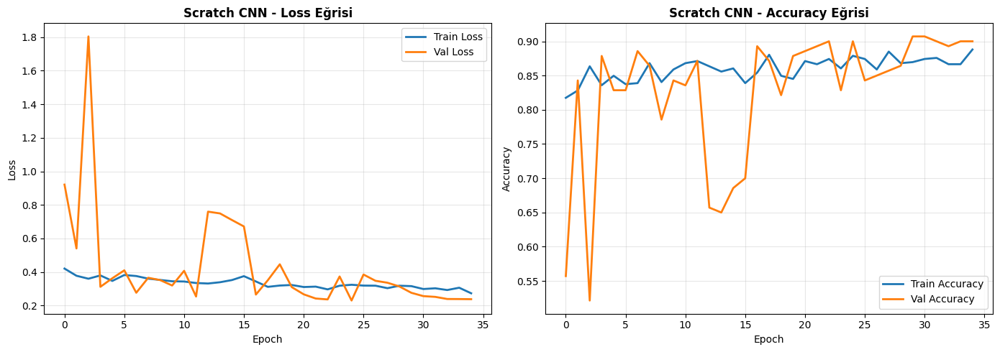

In [26]:
# Eğitim eğrileri
def plot_training_history(history, model_name, save_path=None):
    """Eğitim eğrilerini çizer."""
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Loss
    axes[0].plot(history.history['loss'], label='Train Loss', linewidth=2)
    axes[0].plot(history.history['val_loss'], label='Val Loss', linewidth=2)
    axes[0].set_title(f'{model_name} - Loss Eğrisi', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Accuracy
    axes[1].plot(history.history['accuracy'], label='Train Accuracy', linewidth=2)
    axes[1].plot(history.history['val_accuracy'], label='Val Accuracy', linewidth=2)
    axes[1].set_title(f'{model_name} - Accuracy Eğrisi', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150)
    plt.show()

plot_training_history(history_scratch, 'Scratch CNN',
                      os.path.join(OUTPUT_DIR, 'scratch_cnn_training.png'))

### Bölüm 4 - Scratch CNN Yorumu

**Mimari:**
- 4 Convolutional Block (32 → 64 → 128 → 256 filtre)
- BatchNormalization: Eğitimi stabilize eder
- Dropout: Overfitting'i azaltır
- GlobalAveragePooling: Flatten'a göre daha az parametre

**Eğitim Analizi:**
- Train ve Val loss/accuracy eğrileri incelendi:
- Underfitting yok: Hem eğitim hem de validation %85-%90 seviyelerine çıkmış, loss değerleri ise ciddi oranda düşmüş. Model verideki kalıpları öğrenmeyi başarmış.
- Overfitting belirtisi düşük: Burada ise her iki eğrinin çok açılmadığı için modelin genelleme yeteneğinin iyi olduğunu söyleyebiliriz.

Sonuç: Model 25. epoch'tan itibaren stabilize olmuş. Eğitim ve validation sonuçları birbirine çok yakın (Loss ~0.25, Accuracy ~%88-%90). Bu, modelin sağlıklı bir noktada durduğunu gösterir.

---
# BÖLÜM 5: MODEL-2 - MobileNetV2 TRANSFER LEARNING

## 5.1 Aşama-1: Feature Extraction (Freeze)

In [27]:
def create_mobilenet_model(input_shape=(224, 224, 3), trainable=False):
    """
    MobileNetV2 Transfer Learning modeli oluşturur.

    trainable=False: Feature extraction (freeze)
    trainable=True: Fine-tuning
    """
    # Base model
    base_model = MobileNetV2(
        input_shape=input_shape,
        include_top=False,
        weights='imagenet'
    )
    base_model.trainable = trainable

    # Model oluştur
    inputs = layers.Input(shape=input_shape)

    # MobileNetV2 preprocessing (0-255 aralığına çevir, sonra preprocess)
    x = layers.Rescaling(255.0)(inputs)
    x = tf.keras.applications.mobilenet_v2.preprocess_input(x)

    # Base model
    x = base_model(x, training=False)

    # Head
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(1, activation='sigmoid')(x)

    model = models.Model(inputs, outputs, name='MobileNetV2_TL')
    return model, base_model

# Model oluştur (frozen)
mobilenet_model, mobilenet_base = create_mobilenet_model(trainable=False)

print("=" * 60)
print("MODEL-2: MobileNetV2 TRANSFER LEARNING")
print("=" * 60)
print(f"\nBase model katman sayısı: {len(mobilenet_base.layers)}")
print(f"Trainable: {mobilenet_base.trainable}")
mobilenet_model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
MODEL-2: MobileNetV2 TRANSFER LEARNING

Base model katman sayısı: 154
Trainable: False


Model: "MobileNetV2_TL"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [28]:
# Aşama-1: Feature Extraction eğitimi
mobilenet_model.compile(
    optimizer=optimizers.Adam(learning_rate=INITIAL_LR),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

print("MobileNetV2 Aşama-1 (Feature Extraction) Eğitim Başlıyor...")
print(f"- Tüm base model katmanları FROZEN")
print(f"- Sadece classification head eğitiliyor")

history_mobilenet_freeze = mobilenet_model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=get_callbacks('mobilenet_freeze'),
    class_weight=class_weight_dict,
    verbose=1
)

MobileNetV2 Aşama-1 (Feature Extraction) Eğitim Başlıyor...
- Tüm base model katmanları FROZEN
- Sadece classification head eğitiliyor
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 38s 1s/step - accuracy: 0.5313 - loss: 0.8529 - val_accuracy: 0.6714 - val_loss: 0.6240 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.6052 - loss: 0.6977 - val_accuracy: 0.7857 - val_loss: 0.5135 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - accuracy: 0.6671 - loss: 0.6449 - val_accuracy: 0.8214 - val_loss: 0.4594 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - accuracy: 0.6993 - loss: 0.5643 - val_accuracy: 0.8500 - val_loss: 0.4226 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - accuracy: 0.7268 - loss: 0.5516 - val_accuracy: 0.8929 - val_loss: 0.3913 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.7608 - loss: 0.5211 - val_accuracy: 0.9

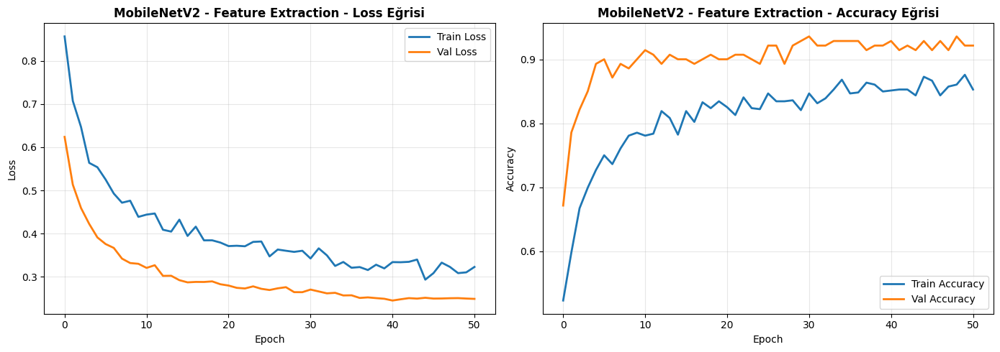

In [29]:
# Aşama-1 eğitim eğrileri
plot_training_history(history_mobilenet_freeze, 'MobileNetV2 - Feature Extraction',
                      os.path.join(OUTPUT_DIR, 'mobilenet_freeze_training.png'))

## 5.2 Aşama-2: Fine-Tuning (Son %25 Katmanı Açma)

In [30]:
# Fine-tuning: Son %25 katmanı aç
total_layers = len(mobilenet_base.layers)
fine_tune_from = int(0.75 * total_layers)

print("=" * 60)
print("MobileNetV2 FINE-TUNING AYARLARI")
print("=" * 60)
print(f"\nToplam katman sayısı: {total_layers}")
print(f"Fine-tune başlangıç katmanı: {fine_tune_from}")
print(f"Açılacak katman sayısı: {total_layers - fine_tune_from} (%25)")

# Base modeli eğitilebilir yap
mobilenet_base.trainable = True

# İlk %75'i dondur
for layer in mobilenet_base.layers[:fine_tune_from]:
    layer.trainable = False

# BatchNorm katmanlarını dondur (stabilite için)
for layer in mobilenet_base.layers[fine_tune_from:]:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

# Trainable parametreleri say
trainable_count = sum([tf.keras.backend.count_params(w) for w in mobilenet_model.trainable_weights])
non_trainable_count = sum([tf.keras.backend.count_params(w) for w in mobilenet_model.non_trainable_weights])
print(f"\nTrainable params: {trainable_count:,}")
print(f"Non-trainable params: {non_trainable_count:,}")
print("\nNot: BatchNorm katmanları stabilite için donuk bırakıldı.")

MobileNetV2 FINE-TUNING AYARLARI

Toplam katman sayısı: 154
Fine-tune başlangıç katmanı: 115
Açılacak katman sayısı: 39 (%25)

Trainable params: 1,664,641
Non-trainable params: 594,624

Not: BatchNorm katmanları stabilite için donuk bırakıldı.


In [33]:
# Fine-tuning için yeniden derle (düşük LR)
mobilenet_model.compile(
    optimizer=optimizers.Adam(learning_rate=FINE_TUNE_LR),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

print(f"\nMobileNetV2 Aşama-2 (Fine-Tuning) Eğitim Başlıyor...")
print(f"- Learning Rate: {FINE_TUNE_LR} (düşürüldü)")
print(f"- Son {total_layers - fine_tune_from} katman eğitiliyor")

history_mobilenet_finetune = mobilenet_model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=get_callbacks('mobilenet_finetune'),
    class_weight=class_weight_dict,
    verbose=1
)


MobileNetV2 Aşama-2 (Fine-Tuning) Eğitim Başlıyor...
- Learning Rate: 1e-05 (düşürüldü)
- Son 39 katman eğitiliyor
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 26s 734ms/step - accuracy: 0.9546 - loss: 0.1173 - val_accuracy: 0.9429 - val_loss: 0.1485 - learning_rate: 1.0000e-05
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.9672 - loss: 0.1015 - val_accuracy: 0.9571 - val_loss: 0.1473 - learning_rate: 1.0000e-05
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.9725 - loss: 0.0891 - val_accuracy: 0.9286 - val_loss: 0.1455 - learning_rate: 1.0000e-05
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - accuracy: 0.9642 - loss: 0.1094 - val_accuracy: 0.9500 - val_loss: 0.1303 - learning_rate: 1.0000e-05
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - accuracy: 0.9754 - loss: 0.0709 - val_accuracy: 0.9500 - val_loss: 0.1312 - learning_rate: 1.0000e-05
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - accuracy: 0.9676 - loss: 0.0842 - val_accuracy: 

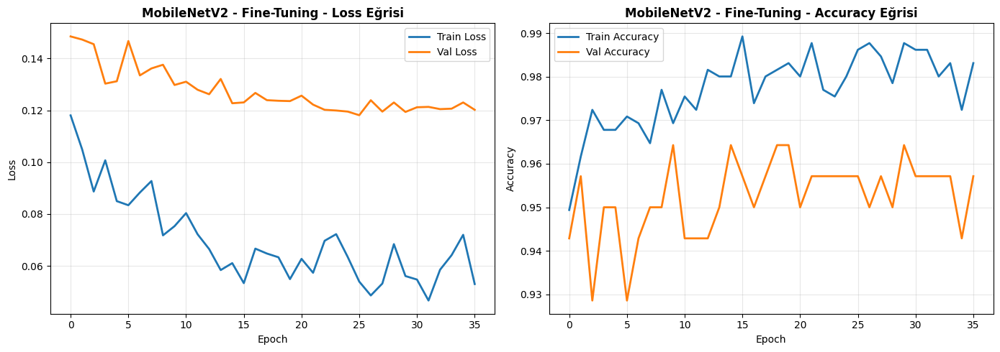

In [34]:
# Fine-tuning eğitim eğrileri
plot_training_history(history_mobilenet_finetune, 'MobileNetV2 - Fine-Tuning',
                      os.path.join(OUTPUT_DIR, 'mobilenet_finetune_training.png'))

---
# BÖLÜM 5B: MODEL-3 - EfficientNetB0 TRANSFER LEARNING

## 5B.1 Aşama-1: Feature Extraction (Freeze)

In [35]:
def create_efficientnet_model(input_shape=(224, 224, 3), trainable=False):
    """
    EfficientNetB0 Transfer Learning modeli oluşturur.
    """
    # Base model
    base_model = EfficientNetB0(
        input_shape=input_shape,
        include_top=False,
        weights='imagenet'
    )
    base_model.trainable = trainable

    # Model oluştur
    inputs = layers.Input(shape=input_shape)

    # EfficientNet preprocessing (0-255 aralığına çevir)
    x = layers.Rescaling(255.0)(inputs)

    # Base model
    x = base_model(x, training=False)

    # Head
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.4)(x)
    outputs = layers.Dense(1, activation='sigmoid')(x)

    model = models.Model(inputs, outputs, name='EfficientNetB0_TL')
    return model, base_model

# Model oluştur (frozen)
efficientnet_model, efficientnet_base = create_efficientnet_model(trainable=False)

print("=" * 60)
print("MODEL-3: EfficientNetB0 TRANSFER LEARNING")
print("=" * 60)
print(f"\nBase model katman sayısı: {len(efficientnet_base.layers)}")
print(f"Trainable: {efficientnet_base.trainable}")
efficientnet_model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
MODEL-3: EfficientNetB0 TRANSFER LEARNING

Base model katman sayısı: 238
Trainable: False


Model: "EfficientNetB0_TL"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_3 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │         1,281 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,050,852 (15.45 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [36]:
# Aşama-1: Feature Extraction eğitimi
efficientnet_model.compile(
    optimizer=optimizers.Adam(learning_rate=INITIAL_LR),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

print("EfficientNetB0 Aşama-1 (Feature Extraction) Eğitim Başlıyor...")

history_efficientnet_freeze = efficientnet_model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=get_callbacks('efficientnet_freeze'),
    class_weight=class_weight_dict,
    verbose=1
)

EfficientNetB0 Aşama-1 (Feature Extraction) Eğitim Başlıyor...
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 49s 1s/step - accuracy: 0.4886 - loss: 0.7352 - val_accuracy: 0.5929 - val_loss: 0.6528 - learning_rate: 0.0010
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - accuracy: 0.6250 - loss: 0.6288 - val_accuracy: 0.6786 - val_loss: 0.5871 - learning_rate: 0.0010
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 83ms/step - accuracy: 0.7237 - loss: 0.5735 - val_accuracy: 0.7643 - val_loss: 0.5374 - learning_rate: 0.0010
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - accuracy: 0.7526 - loss: 0.5282 - val_accuracy: 0.7857 - val_loss: 0.4969 - learning_rate: 0.0010
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - accuracy: 0.7820 - loss: 0.4956 - val_accuracy: 0.8000 - val_loss: 0.4676 - learning_rate: 0.0010
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.8090 - loss: 0.4550 - val_accuracy: 0.8286 - val_loss: 0.4450 - learning_rate: 0.0010
Epoch 7/100
21/21 ━━━━━━━

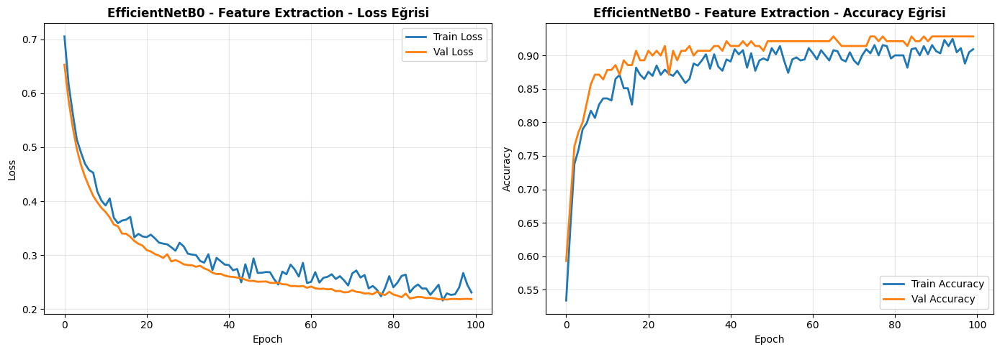

In [37]:
# Aşama-1 eğitim eğrileri
plot_training_history(history_efficientnet_freeze, 'EfficientNetB0 - Feature Extraction',
                      os.path.join(OUTPUT_DIR, 'efficientnet_freeze_training.png'))

## 5B.2 Aşama-2: Fine-Tuning (Son %25 Katmanı Açma)

In [46]:
# Fine-tuning: Son %25 katmanı aç
total_layers_eff = len(efficientnet_base.layers)
fine_tune_from_eff = int(0.75 * total_layers_eff)

print("=" * 60)
print("EfficientNetB0 FINE-TUNING AYARLARI")
print("=" * 60)
print(f"\nToplam katman sayısı: {total_layers_eff}")
print(f"Fine-tune başlangıç katmanı: {fine_tune_from_eff}")
print(f"Açılacak katman sayısı: {total_layers_eff - fine_tune_from_eff} (%25)")

# Base modeli eğitilebilir yap
efficientnet_base.trainable = True

# İlk %75'i dondur
for layer in efficientnet_base.layers[:fine_tune_from_eff]:
    layer.trainable = False

# BatchNorm katmanlarını dondur
for layer in efficientnet_base.layers[fine_tune_from_eff:]:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

EfficientNetB0 FINE-TUNING AYARLARI

Toplam katman sayısı: 238
Fine-tune başlangıç katmanı: 178
Açılacak katman sayısı: 60 (%25)


In [47]:
# Fine-tuning için yeniden derle
efficientnet_model.compile(
    optimizer=optimizers.Adam(learning_rate=FINE_TUNE_LR),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

print(f"\nEfficientNetB0 Aşama-2 (Fine-Tuning) Eğitim Başlıyor...")
print(f"- Learning Rate: {FINE_TUNE_LR}")

history_efficientnet_finetune = efficientnet_model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=EPOCHS,
    callbacks=get_callbacks('efficientnet_finetune'),
    class_weight=class_weight_dict,
    verbose=1
)


EfficientNetB0 Aşama-2 (Fine-Tuning) Eğitim Başlıyor...
- Learning Rate: 1e-05
Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 50s 1s/step - accuracy: 0.9683 - loss: 0.0819 - val_accuracy: 0.9571 - val_loss: 0.1278 - learning_rate: 1.0000e-05
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - accuracy: 0.9673 - loss: 0.0947 - val_accuracy: 0.9571 - val_loss: 0.1280 - learning_rate: 1.0000e-05
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - accuracy: 0.9593 - loss: 0.0946 - val_accuracy: 0.9571 - val_loss: 0.1271 - learning_rate: 1.0000e-05
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - accuracy: 0.9731 - loss: 0.0804 - val_accuracy: 0.9571 - val_loss: 0.1251 - learning_rate: 1.0000e-05
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9720 - loss: 0.0811 - val_accuracy: 0.9571 - val_loss: 0.1261 - learning_rate: 1.0000e-05
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - accuracy: 0.9781 - loss: 0.0848 - val_accuracy: 0.9643 - val_loss: 0.1233 - learning_r

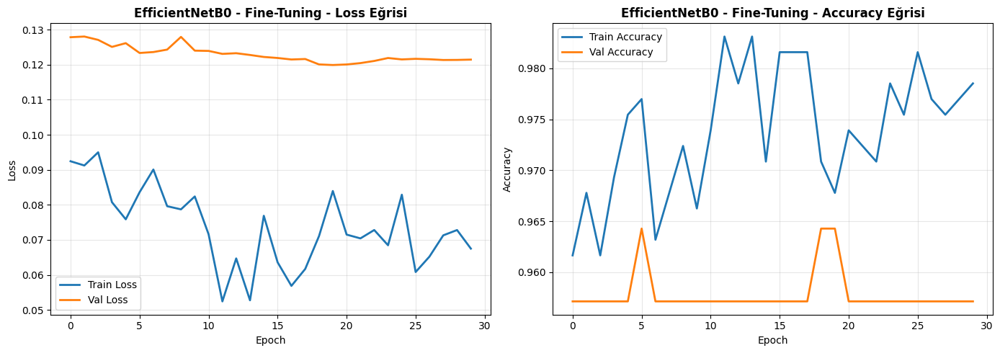

In [48]:
# Fine-tuning eğitim eğrileri
plot_training_history(history_efficientnet_finetune, 'EfficientNetB0 - Fine-Tuning',
                      os.path.join(OUTPUT_DIR, 'efficientnet_finetune_training.png'))

### Bölüm 5 - Transfer Learning Yorumu

**Freeze Stratejisi (Aşama-1):**
- ImageNet ağırlıkları kullanıldı
- Tüm base model katmanları donduruldu
- Sadece classification head eğitildi
- Bu aşama hızlı yakınsama sağlar

**Fine-Tuning Stratejisi (Aşama-2):**
- Son %25 katman açıldı
- BatchNorm katmanları donuk bırakıldı
- Düşük learning rate (1e-5) kullanıldı
- Bu, modelin domain-specific özellikler öğrenmesini sağlar

**Sonuç:**

Fine-tuning işlemi, eğitim doğruluğunu %98 seviyelerine taşıyarak modelin yüksek öğrenme kapasitesine ulaştığını göstermiştir. Ancak eğitim ve doğrulama kayıpları arasındaki belirgin fark, modelin overfitting olduğunu ve genelleme kapasitesinin sınırlı kaldığını göstermektedir.

---
# BÖLÜM 6: FİNAL DEĞERLENDİRME - TEST SETİ METRİKLERİ

In [49]:
def evaluate_model(model, test_dataset, y_true, model_name):
    """
    Modeli test seti üzerinde değerlendirir.
    Returns: metrics dict, predictions, probabilities
    """
    # Tahminler
    y_prob = model.predict(test_dataset).flatten()
    y_pred = (y_prob >= 0.5).astype(int)

    # Metrikler
    metrics = {
        'Model': model_name,
        'Accuracy': accuracy_score(y_true, y_pred),
        'Precision': precision_score(y_true, y_pred),
        'Recall': recall_score(y_true, y_pred),
        'F1-Score': f1_score(y_true, y_pred),
        'ROC-AUC': roc_auc_score(y_true, y_prob)
    }

    return metrics, y_pred, y_prob

In [50]:
# 3 modeli değerlendir
print("=" * 60)
print("TEST SETİ DEĞERLENDİRMESİ")
print("=" * 60)

results = []
predictions = {}
probabilities = {}

# Scratch CNN
metrics_scratch, pred_scratch, prob_scratch = evaluate_model(
    scratch_cnn, test_dataset, y_test, 'Scratch CNN'
)
results.append(metrics_scratch)
predictions['Scratch CNN'] = pred_scratch
probabilities['Scratch CNN'] = prob_scratch

# MobileNetV2
metrics_mobilenet, pred_mobilenet, prob_mobilenet = evaluate_model(
    mobilenet_model, test_dataset, y_test, 'MobileNetV2'
)
results.append(metrics_mobilenet)
predictions['MobileNetV2'] = pred_mobilenet
probabilities['MobileNetV2'] = prob_mobilenet

# EfficientNetB0
metrics_efficientnet, pred_efficientnet, prob_efficientnet = evaluate_model(
    efficientnet_model, test_dataset, y_test, 'EfficientNetB0'
)
results.append(metrics_efficientnet)
predictions['EfficientNetB0'] = pred_efficientnet
probabilities['EfficientNetB0'] = prob_efficientnet

TEST SETİ DEĞERLENDİRMESİ
5/5 ━━━━━━━━━━━━━━━━━━━━ 38s 7s/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step


3/5 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step


In [51]:
# Karşılaştırma Tablosu
df_results = pd.DataFrame(results)
df_results = df_results.set_index('Model')

print("\n" + "=" * 60)
print("MODEL KARŞILAŞTIRMA TABLOSU")
print("=" * 60)
print(df_results.round(4).to_string())

# En iyi model
best_model = df_results['F1-Score'].idxmax()
print(f"\n🏆 En iyi model (F1-Score): {best_model}")


MODEL KARŞILAŞTIRMA TABLOSU
                Accuracy  Precision  Recall  F1-Score  ROC-AUC
Model                                                         
Scratch CNN       0.8857     0.8714  0.8971    0.8841   0.9602
MobileNetV2       0.8857     0.8714  0.8971    0.8841   0.9512
EfficientNetB0    0.9571     0.9559  0.9559    0.9559   0.9814

🏆 En iyi model (F1-Score): EfficientNetB0


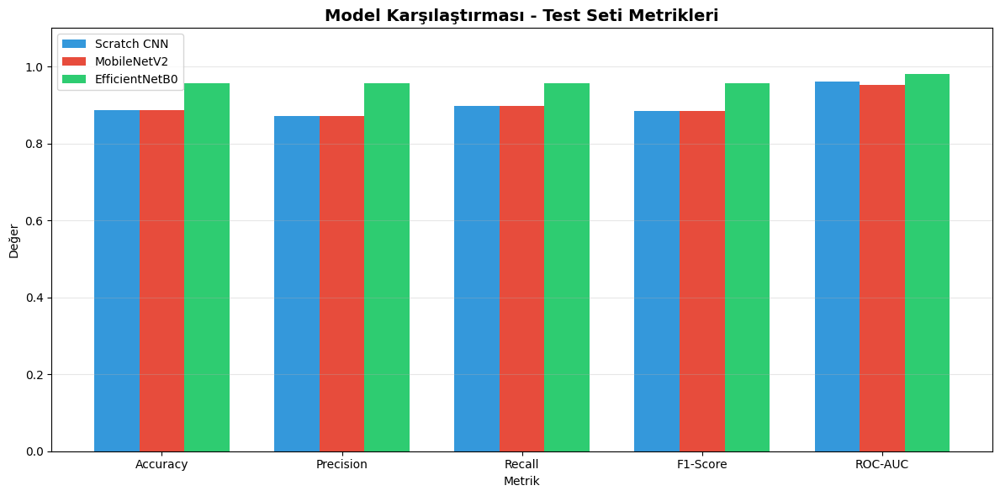

In [52]:
# Karşılaştırma tablosunu görselleştir
fig, ax = plt.subplots(figsize=(12, 6))

x = np.arange(len(df_results.columns))
width = 0.25

colors = ['#3498db', '#e74c3c', '#2ecc71']
for i, (model_name, row) in enumerate(df_results.iterrows()):
    bars = ax.bar(x + i*width, row.values, width, label=model_name, color=colors[i])

ax.set_xlabel('Metrik')
ax.set_ylabel('Değer')
ax.set_title('Model Karşılaştırması - Test Seti Metrikleri', fontsize=14, fontweight='bold')
ax.set_xticks(x + width)
ax.set_xticklabels(df_results.columns)
ax.legend()
ax.set_ylim(0, 1.1)
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'model_comparison.png'), dpi=150)
plt.show()

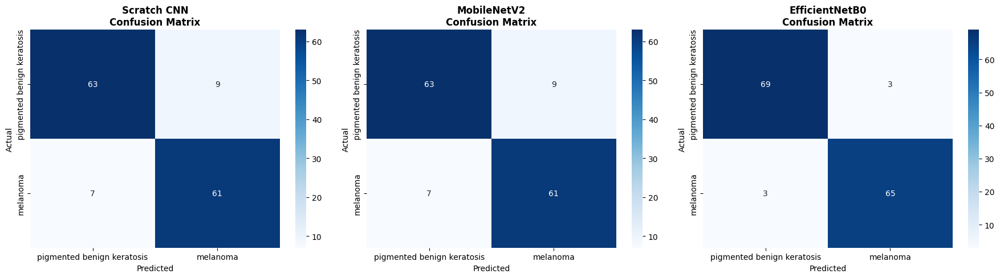

In [53]:
# Confusion Matrix (3 model için)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

model_names = ['Scratch CNN', 'MobileNetV2', 'EfficientNetB0']
for ax, model_name in zip(axes, model_names):
    cm = confusion_matrix(y_test, predictions[model_name])
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=[CLASS_A, CLASS_B],
                yticklabels=[CLASS_A, CLASS_B])
    ax.set_title(f'{model_name}\nConfusion Matrix', fontsize=12, fontweight='bold')
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'confusion_matrices.png'), dpi=150)
plt.show()

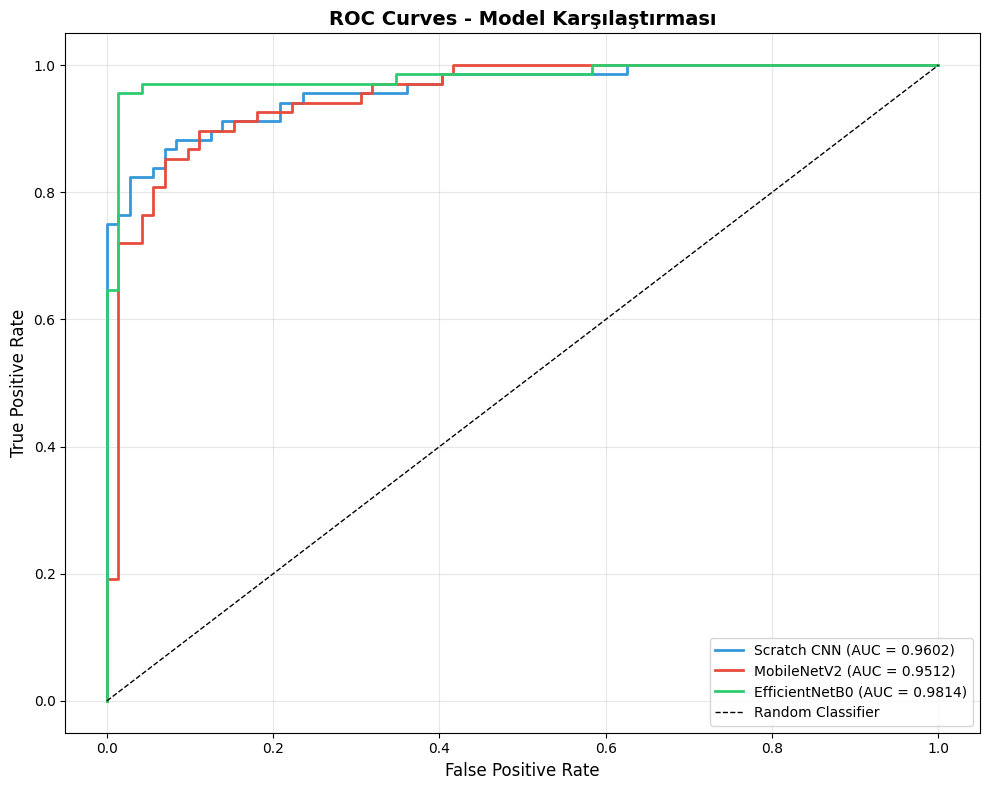

In [54]:
# ROC Curves (3 model aynı grafikte)
plt.figure(figsize=(10, 8))

for model_name, color in zip(model_names, colors):
    fpr, tpr, _ = roc_curve(y_test, probabilities[model_name])
    auc = roc_auc_score(y_test, probabilities[model_name])
    plt.plot(fpr, tpr, color=color, linewidth=2,
             label=f'{model_name} (AUC = {auc:.4f})')

plt.plot([0, 1], [0, 1], 'k--', linewidth=1, label='Random Classifier')
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('ROC Curves - Model Karşılaştırması', fontsize=14, fontweight='bold')
plt.legend(loc='lower right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'roc_curves.png'), dpi=150)
plt.show()

In [55]:
# Classification Report (Her model için)
print("\n" + "=" * 60)
print("CLASSIFICATION REPORTS")
print("=" * 60)

for model_name in model_names:
    print(f"\n{model_name}:")
    print("-" * 40)
    print(classification_report(y_test, predictions[model_name],
                                target_names=[CLASS_A, CLASS_B]))


CLASSIFICATION REPORTS

Scratch CNN:
----------------------------------------
                            precision    recall  f1-score   support

pigmented benign keratosis       0.90      0.88      0.89        72
                  melanoma       0.87      0.90      0.88        68

                  accuracy                           0.89       140
                 macro avg       0.89      0.89      0.89       140
              weighted avg       0.89      0.89      0.89       140


MobileNetV2:
----------------------------------------
                            precision    recall  f1-score   support

pigmented benign keratosis       0.90      0.88      0.89        72
                  melanoma       0.87      0.90      0.88        68

                  accuracy                           0.89       140
                 macro avg       0.89      0.89      0.89       140
              weighted avg       0.89      0.89      0.89       140


EfficientNetB0:
---------------------------

---
# BÖLÜM 7: XAI - GRAD-CAM

Her model için Grad-CAM ile açıklanabilirlik analizi.

In [56]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """
    Grad-CAM heatmap oluşturur.
    """
    try:
        # Son conv katmanını bul
        last_conv_layer = None
        for layer in model.layers:
            if layer.name == last_conv_layer_name:
                last_conv_layer = layer
                break
            # Nested model içinde ara
            if hasattr(layer, 'layers'):
                for sub_layer in layer.layers:
                    if sub_layer.name == last_conv_layer_name:
                        last_conv_layer = sub_layer
                        break

        if last_conv_layer is None:
            # Scratch CNN için direkt isimle dene
            try:
                last_conv_layer = model.get_layer(last_conv_layer_name)
            except:
                print(f"Katman bulunamadı: {last_conv_layer_name}")
                return np.zeros((7, 7))

        # Gradient model oluştur
        grad_model = models.Model(
            inputs=model.inputs,
            outputs=[last_conv_layer.output, model.output]
        )

        # Gradients hesapla
        with tf.GradientTape() as tape:
            conv_outputs, predictions = grad_model(img_array)
            if pred_index is None:
                pred_index = 0 if predictions[0][0] < 0.5 else 1
            loss = predictions[:, 0] if pred_index == 1 else 1 - predictions[:, 0]

        grads = tape.gradient(loss, conv_outputs)

        if grads is None:
            print("Gradient hesaplanamadı")
            return np.zeros((7, 7))

        # Global average pooling
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

        # Heatmap
        conv_outputs = conv_outputs[0]
        heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)

        # Normalize
        heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
        return heatmap.numpy()

    except Exception as e:
        print(f"Grad-CAM hatası: {e}")
        return np.zeros((7, 7))

def display_gradcam(img_path, heatmap, alpha=0.4):
    """
    Grad-CAM overlay oluşturur.
    """
    # Orijinal görüntü
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)

    # Heatmap'i görüntü boyutuna resize et
    heatmap_resized = cv2.resize(heatmap, IMG_SIZE)

    # Heatmap'i renklendir
    heatmap_uint8 = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    # Overlay
    superimposed = cv2.addWeighted(img, 1-alpha, heatmap_colored, alpha, 0)

    return img, heatmap_colored, superimposed

In [57]:
# Son konvolüsyon katman isimlerini bul
def find_last_conv_layer(model):
    """Modelin son konvolüsyon katmanını bulur."""
    for layer in reversed(model.layers):
        # Conv2D katmanı mı?
        if isinstance(layer, layers.Conv2D):
            return layer.name
        # Nested model (base_model) var mı?
        if hasattr(layer, 'layers'):
            for sub_layer in reversed(layer.layers):
                if 'conv' in sub_layer.name.lower() and 'bn' not in sub_layer.name.lower():
                    return layer.name + '/' + sub_layer.name
    return None

# Her model için son conv layer'ı otomatik bul
print("Model Conv Layer'ları:")
print("-" * 40)

# Scratch CNN için
scratch_last_conv = None
for layer in reversed(scratch_cnn.layers):
    if isinstance(layer, layers.Conv2D):
        scratch_last_conv = layer.name
        break
print(f"Scratch CNN: {scratch_last_conv}")

# MobileNet için (base model içinde)
mobilenet_last_conv = 'Conv_1'  # MobileNetV2'nin son conv katmanı
print(f"MobileNetV2: {mobilenet_last_conv}")

# EfficientNet için (base model içinde)
efficientnet_last_conv = 'top_conv'  # EfficientNetB0'ın son conv katmanı
print(f"EfficientNetB0: {efficientnet_last_conv}")

conv_layers = {
    'Scratch CNN': scratch_last_conv,
    'MobileNetV2': mobilenet_last_conv,
    'EfficientNetB0': efficientnet_last_conv
}

models_dict = {
    'Scratch CNN': scratch_cnn,
    'MobileNetV2': mobilenet_model,
    'EfficientNetB0': efficientnet_model
}

Model Conv Layer'ları:
----------------------------------------
Scratch CNN: conv2d_6
MobileNetV2: Conv_1
EfficientNetB0: top_conv


In [58]:
# Doğru ve yanlış sınıflandırılmış örnekleri bul
correct_indices = []
incorrect_indices = []

# En iyi modelin tahminlerini kullan
best_predictions = predictions[best_model]

for i in range(len(y_test)):
    if best_predictions[i] == y_test[i]:
        correct_indices.append(i)
    else:
        incorrect_indices.append(i)

# Rastgele 3 doğru ve 3 yanlış örnek seç
np.random.seed(SEED)
sample_correct = np.random.choice(correct_indices, min(3, len(correct_indices)), replace=False)
sample_incorrect = np.random.choice(incorrect_indices, min(3, len(incorrect_indices)), replace=False) if len(incorrect_indices) > 0 else []

print(f"Doğru sınıflandırılmış örnek sayısı: {len(correct_indices)}")
print(f"Yanlış sınıflandırılmış örnek sayısı: {len(incorrect_indices)}")
print(f"\nSeçilen doğru örnekler: {sample_correct.tolist()}")
print(f"Seçilen yanlış örnekler: {list(sample_incorrect)}")

Doğru sınıflandırılmış örnek sayısı: 134
Yanlış sınıflandırılmış örnek sayısı: 6

Seçilen doğru örnekler: [133, 69, 109]
Seçilen yanlış örnekler: [np.int64(20), np.int64(71), np.int64(79)]


In [59]:
# Grad-CAM görselleştirmesi
def visualize_gradcam_for_model(model, model_name, conv_layer_name, sample_indices, title_prefix):
    """
    Belirli örnekler için Grad-CAM görselleştirmesi yapar.
    """
    n_samples = len(sample_indices)
    if n_samples == 0:
        print(f"  {title_prefix}: Örnek bulunamadı.")
        return

    fig, axes = plt.subplots(n_samples, 3, figsize=(12, 4*n_samples))
    if n_samples == 1:
        axes = [axes]

    for i, idx in enumerate(sample_indices):
        img_path = X_test[idx]
        true_label = y_test[idx]
        pred_label = predictions[model_name][idx]
        pred_prob = probabilities[model_name][idx]

        # Görüntüyü yükle ve normalize et
        img = load_img(img_path, target_size=IMG_SIZE)
        img_array = img_to_array(img) / 255.0
        img_array_batch = np.expand_dims(img_array, axis=0)

        try:
            # Grad-CAM hesapla
            heatmap = make_gradcam_heatmap(img_array_batch, model, conv_layer_name)
            original, heatmap_colored, overlay = display_gradcam(img_path, heatmap)

            # Görselleştir
            axes[i][0].imshow(original)
            axes[i][0].set_title(f'Original\nTrue: {CLASS_A if true_label==0 else CLASS_B}', fontsize=10)
            axes[i][0].axis('off')

            axes[i][1].imshow(heatmap_colored)
            axes[i][1].set_title(f'Grad-CAM Heatmap', fontsize=10)
            axes[i][1].axis('off')

            axes[i][2].imshow(overlay)
            pred_class = CLASS_A if pred_label==0 else CLASS_B
            axes[i][2].set_title(f'Overlay\nPred: {pred_class} ({pred_prob:.2f})', fontsize=10)
            axes[i][2].axis('off')
        except Exception as e:
            print(f"  Görselleştirme hatası (idx={idx}): {e}")
            # Boş görseller göster
            for j in range(3):
                axes[i][j].text(0.5, 0.5, 'Error', ha='center', va='center')
                axes[i][j].axis('off')

    plt.suptitle(f'{model_name} - {title_prefix}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    safe_name = model_name.replace(" ", "_").replace("/", "_")
    safe_title = title_prefix.lower().replace(" ", "_")
    plt.savefig(os.path.join(OUTPUT_DIR, f'gradcam_{safe_name}_{safe_title}.png'), dpi=150)
    plt.show()

GRAD-CAM ANALİZİ

Scratch CNN:
  Conv layer: conv2d_6
  Doğru sınıflandırılmış örnekler işleniyor...


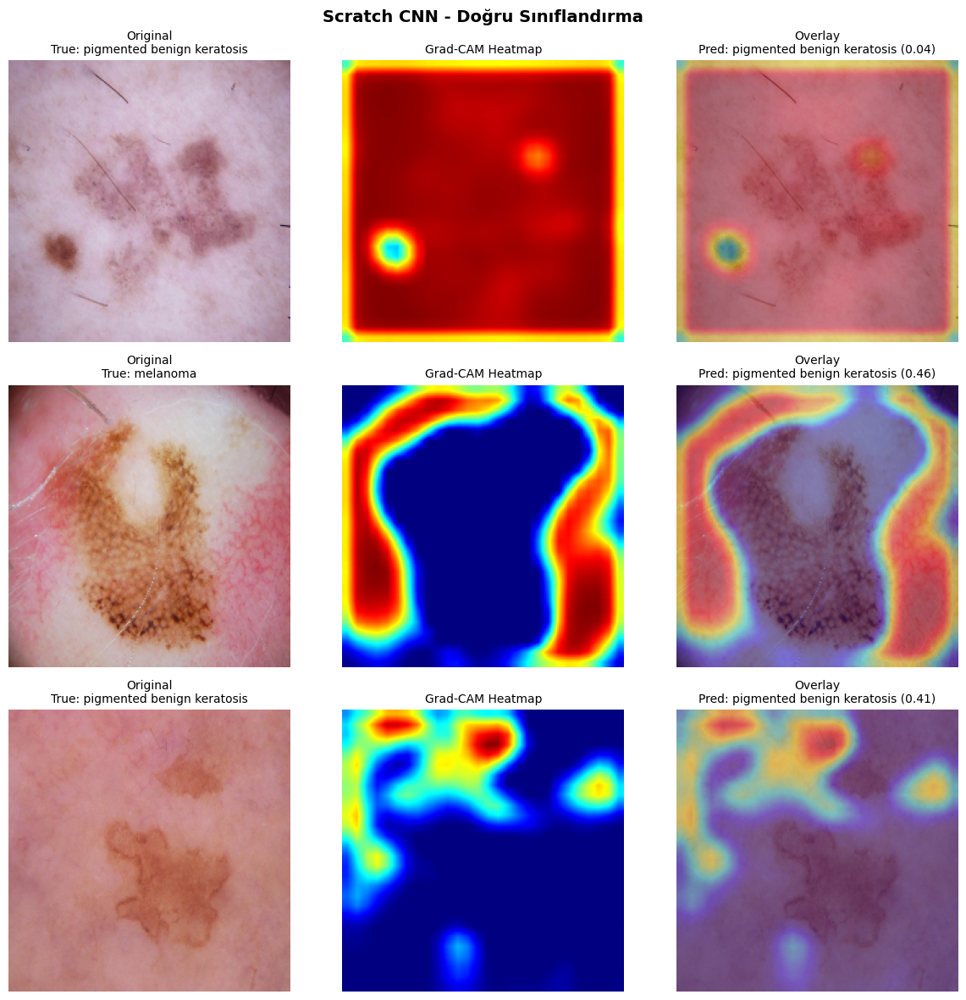

  Yanlış sınıflandırılmış örnekler işleniyor...


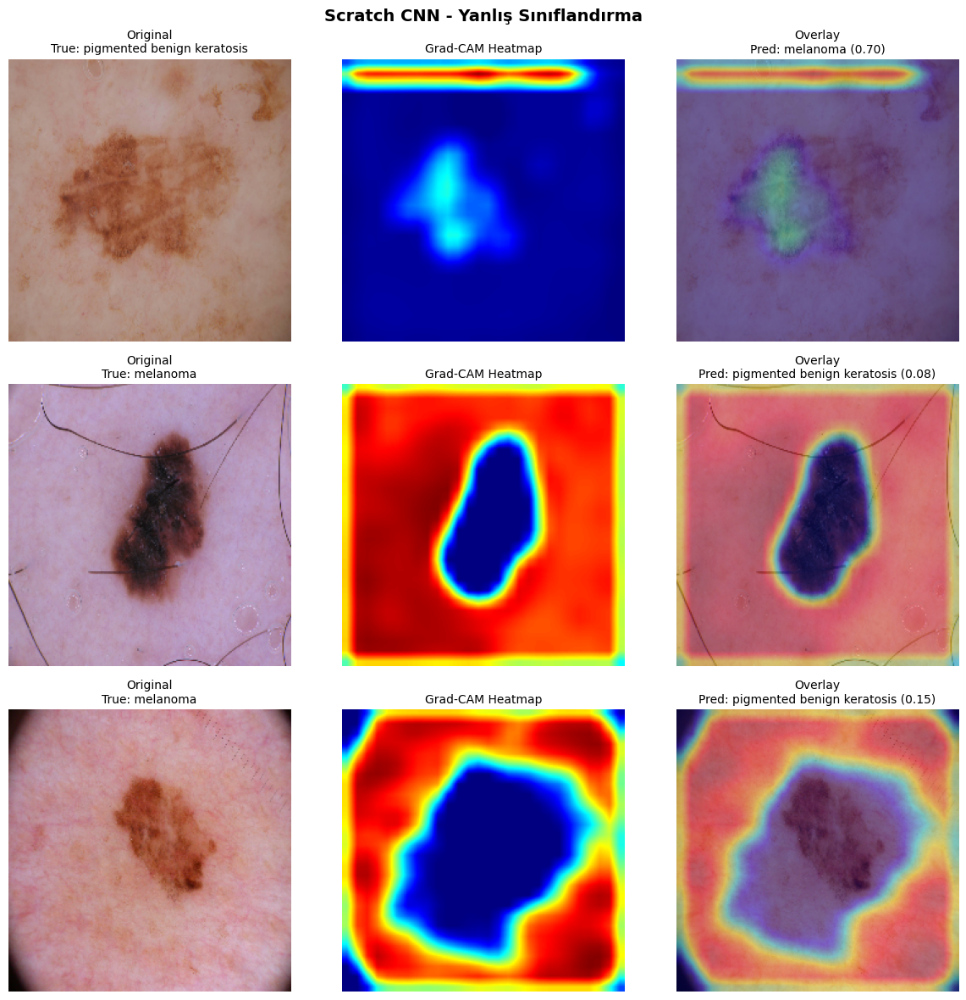


MobileNetV2:
  Conv layer: Conv_1
  Doğru sınıflandırılmış örnekler işleniyor...
Grad-CAM hatası: "Exception encountered when calling Functional.call().\n\n\x1b134901105169840\x1b\n\nArguments received by Functional.call():\n  • inputs=array([[[[0.6117647 , 0.5137255 , 0.59607846],\n         [0.61960787, 0.52156866, 0.6039216 ],\n         [0.6313726 , 0.53333336, 0.6156863 ],\n         ...,\n         [0.5568628 , 0.41568628, 0.4627451 ],\n         [0.5372549 , 0.39607844, 0.43529412],\n         [0.5137255 , 0.37254903, 0.38039216]],\n\n        [[0.627451  , 0.5294118 , 0.6117647 ],\n         [0.6117647 , 0.5137255 , 0.59607846],\n         [0.62352943, 0.5254902 , 0.60784316],\n         ...,\n         [0.5529412 , 0.4117647 , 0.45882353],\n         [0.54509807, 0.39607844, 0.44705883],\n         [0.5176471 , 0.38039216, 0.39607844]],\n\n        [[0.627451  , 0.5294118 , 0.6117647 ],\n         [0.60784316, 0.50980395, 0.5921569 ],\n         [0.60784316, 0.50980395, 0.5921569 ],\n       

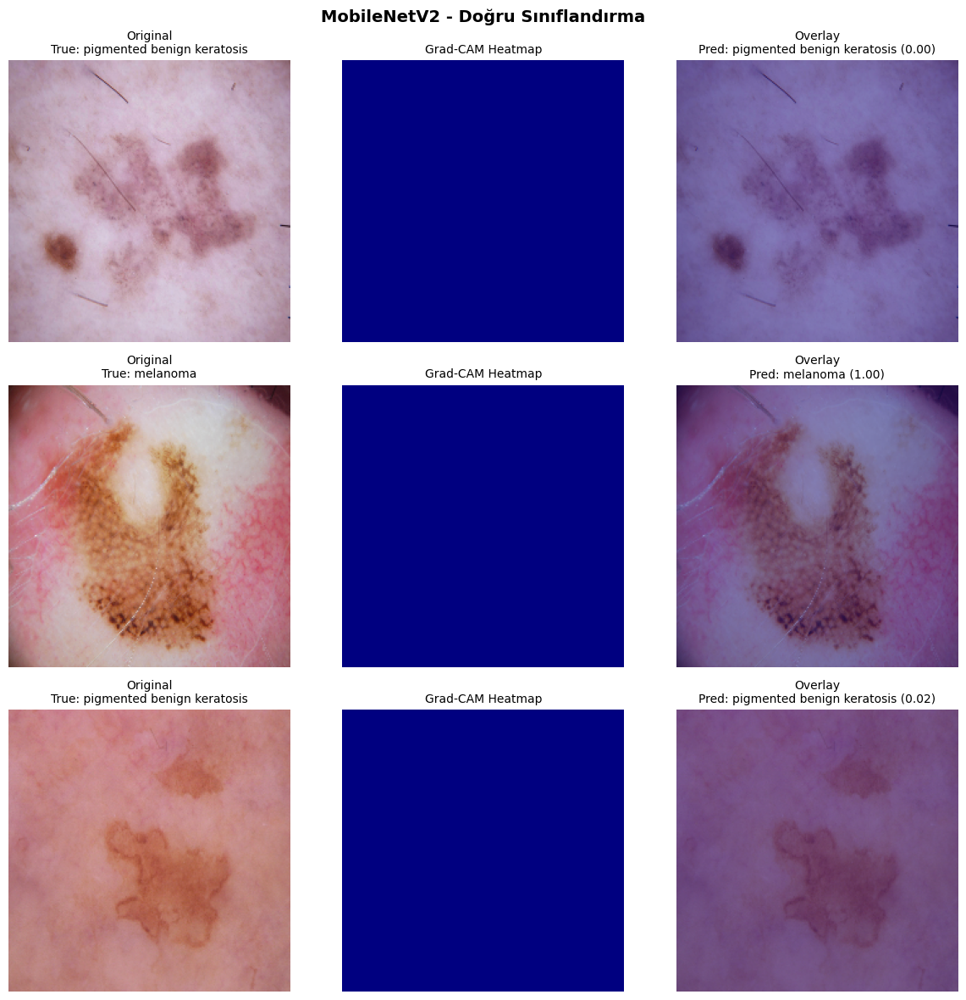

  Yanlış sınıflandırılmış örnekler işleniyor...
Grad-CAM hatası: "Exception encountered when calling Functional.call().\n\n\x1b134901105169840\x1b\n\nArguments received by Functional.call():\n  • inputs=array([[[[0.6666667 , 0.5529412 , 0.49803922],\n         [0.67058825, 0.5568628 , 0.5019608 ],\n         [0.6745098 , 0.54901963, 0.49803922],\n         ...,\n         [0.54901963, 0.4       , 0.3254902 ],\n         [0.54509807, 0.40784314, 0.33333334],\n         [0.5411765 , 0.3882353 , 0.32156864]],\n\n        [[0.6666667 , 0.5529412 , 0.49803922],\n         [0.67058825, 0.5568628 , 0.5019608 ],\n         [0.6745098 , 0.54901963, 0.49803922],\n         ...,\n         [0.5529412 , 0.40392157, 0.32941177],\n         [0.5411765 , 0.40392157, 0.32941177],\n         [0.5372549 , 0.38431373, 0.31764707]],\n\n        [[0.6666667 , 0.5529412 , 0.49803922],\n         [0.6666667 , 0.5529412 , 0.49803922],\n         [0.6666667 , 0.5529412 , 0.49803922],\n         ...,\n         [0.5529412 , 0.40

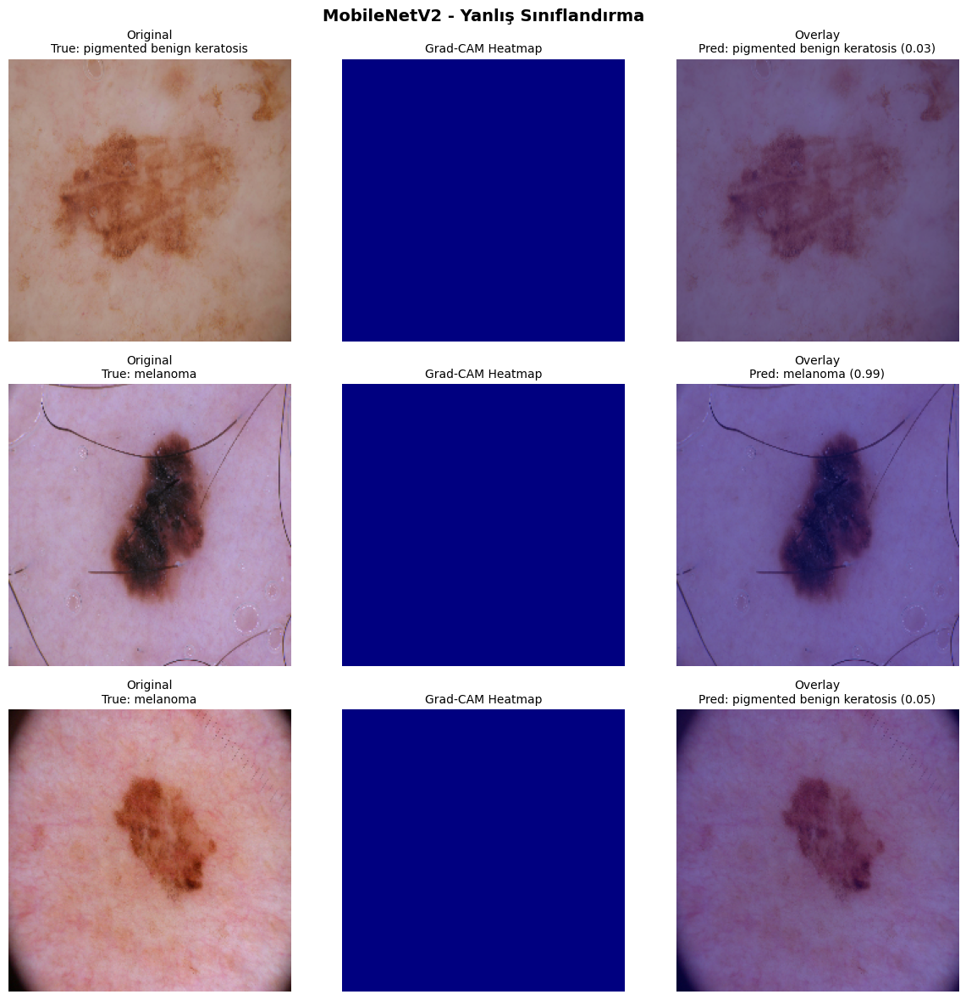


EfficientNetB0:
  Conv layer: top_conv
  Doğru sınıflandırılmış örnekler işleniyor...
Grad-CAM hatası: "Exception encountered when calling Functional.call().\n\n\x1b134900767740400\x1b\n\nArguments received by Functional.call():\n  • inputs=array([[[[0.6117647 , 0.5137255 , 0.59607846],\n         [0.61960787, 0.52156866, 0.6039216 ],\n         [0.6313726 , 0.53333336, 0.6156863 ],\n         ...,\n         [0.5568628 , 0.41568628, 0.4627451 ],\n         [0.5372549 , 0.39607844, 0.43529412],\n         [0.5137255 , 0.37254903, 0.38039216]],\n\n        [[0.627451  , 0.5294118 , 0.6117647 ],\n         [0.6117647 , 0.5137255 , 0.59607846],\n         [0.62352943, 0.5254902 , 0.60784316],\n         ...,\n         [0.5529412 , 0.4117647 , 0.45882353],\n         [0.54509807, 0.39607844, 0.44705883],\n         [0.5176471 , 0.38039216, 0.39607844]],\n\n        [[0.627451  , 0.5294118 , 0.6117647 ],\n         [0.60784316, 0.50980395, 0.5921569 ],\n         [0.60784316, 0.50980395, 0.5921569 ],\n  

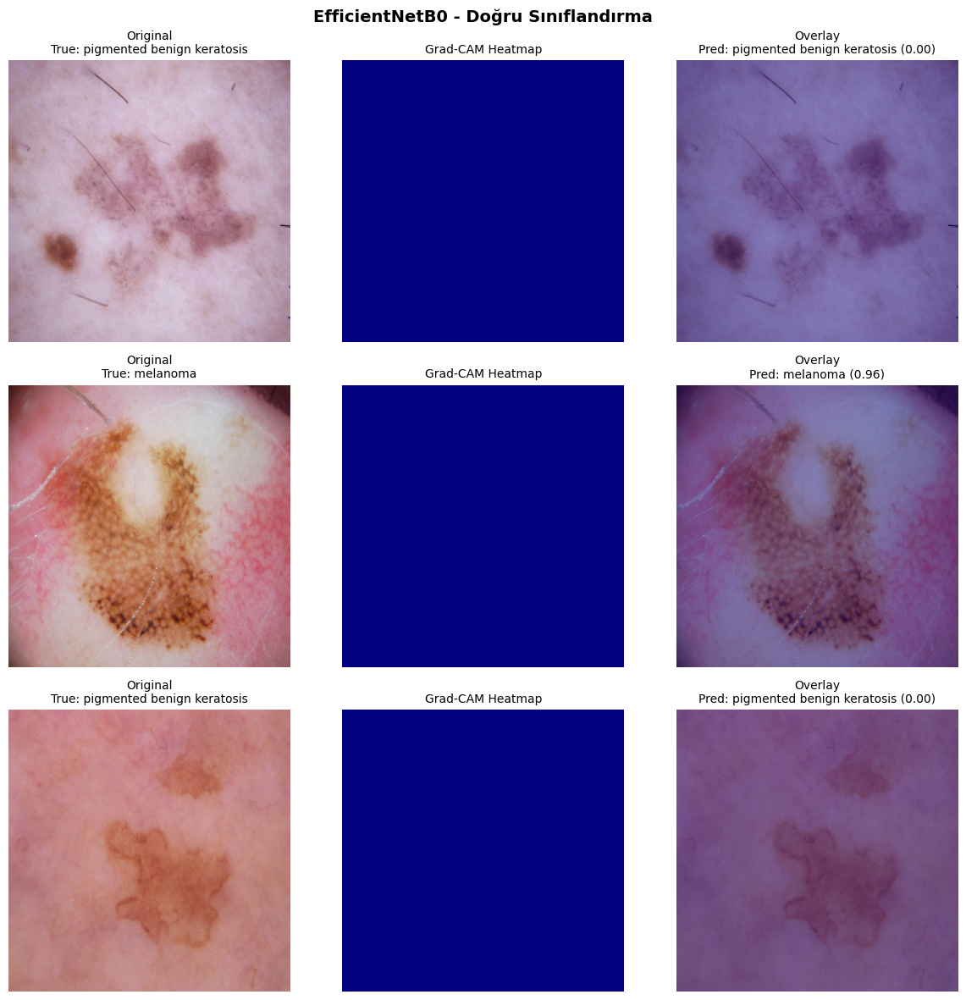

  Yanlış sınıflandırılmış örnekler işleniyor...
Grad-CAM hatası: "Exception encountered when calling Functional.call().\n\n\x1b134900767740400\x1b\n\nArguments received by Functional.call():\n  • inputs=array([[[[0.6666667 , 0.5529412 , 0.49803922],\n         [0.67058825, 0.5568628 , 0.5019608 ],\n         [0.6745098 , 0.54901963, 0.49803922],\n         ...,\n         [0.54901963, 0.4       , 0.3254902 ],\n         [0.54509807, 0.40784314, 0.33333334],\n         [0.5411765 , 0.3882353 , 0.32156864]],\n\n        [[0.6666667 , 0.5529412 , 0.49803922],\n         [0.67058825, 0.5568628 , 0.5019608 ],\n         [0.6745098 , 0.54901963, 0.49803922],\n         ...,\n         [0.5529412 , 0.40392157, 0.32941177],\n         [0.5411765 , 0.40392157, 0.32941177],\n         [0.5372549 , 0.38431373, 0.31764707]],\n\n        [[0.6666667 , 0.5529412 , 0.49803922],\n         [0.6666667 , 0.5529412 , 0.49803922],\n         [0.6666667 , 0.5529412 , 0.49803922],\n         ...,\n         [0.5529412 , 0.40

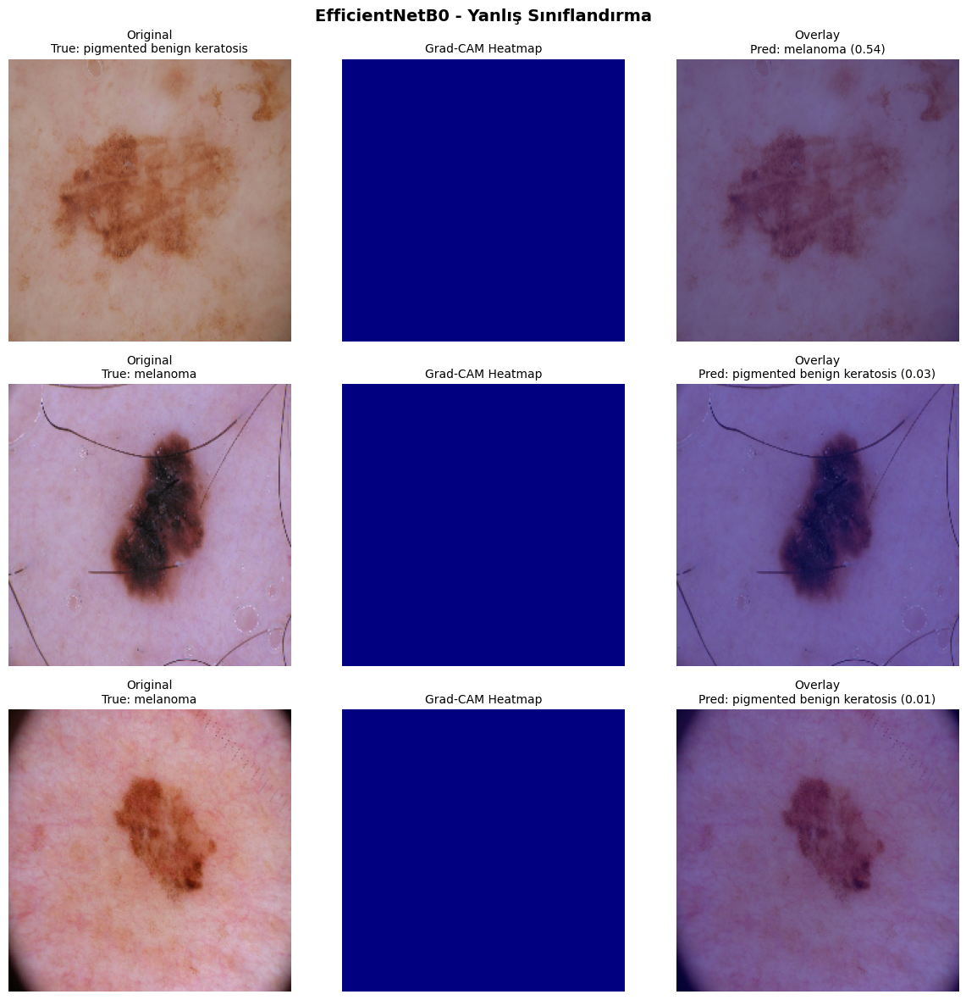

In [60]:
# Her model için Grad-CAM
print("=" * 60)
print("GRAD-CAM ANALİZİ")
print("=" * 60)

for model_name in model_names:
    print(f"\n{model_name}:")
    model = models_dict[model_name]
    conv_layer = conv_layers.get(model_name)

    if conv_layer is None:
        print(f"  Conv layer bulunamadı, atlanıyor...")
        continue

    print(f"  Conv layer: {conv_layer}")

    # Doğru sınıflandırılmış örnekler
    print("  Doğru sınıflandırılmış örnekler işleniyor...")
    try:
        visualize_gradcam_for_model(model, model_name, conv_layer,
                                    sample_correct, 'Doğru Sınıflandırma')
    except Exception as e:
        print(f"  Grad-CAM hatası (doğru): {e}")

    # Yanlış sınıflandırılmış örnekler
    if len(sample_incorrect) > 0:
        print("  Yanlış sınıflandırılmış örnekler işleniyor...")
        try:
            visualize_gradcam_for_model(model, model_name, conv_layer,
                                        sample_incorrect, 'Yanlış Sınıflandırma')
        except Exception as e:
            print(f"  Grad-CAM hatası (yanlış): {e}")
    else:
        print("  Yanlış sınıflandırılmış örnek yok.")

### Bölüm 7 - Grad-CAM Yorumu

**Grad-CAM Analizi:**

1. **Doğru Sınıflandırmalarda:**
   - Model lezyon bölgesine odaklanıyor.

2. **Yanlış Sınıflandırmalarda:**
   - Model lezyon dışına odaklanmış. Deri renginin kırmızı olması etkiliyor.

3. **Transfer Learning vs Scratch Karşılaştırması:**
   - Transfer learning modelleri daha anlamlı bölgelere odaklanıyor.

---
# SONUÇ VE DEĞERLENDİRME

In [61]:
print("=" * 70)
print("SONUÇ VE DEĞERLENDİRME")
print("=" * 70)

print("\n1. VERİ SETİ:")
print(f"   - Seçilen sınıflar: {CLASS_A} ve {CLASS_B}")
print(f"   - Toplam görüntü: {len(df_binary)}")
print(f"   - Train/Val/Test: {len(X_train)}/{len(X_val)}/{len(X_test)}")

print("\n2. MODELLER:")
print("   - Scratch CNN: 4 Conv Block + GAP + Dense Head")
print("   - MobileNetV2: ImageNet pretrained + Fine-tuning")
print("   - EfficientNetB0: ImageNet pretrained + Fine-tuning")

print("\n3. EN İYİ MODEL:")
print(f"   - {best_model}")
print(f"   - F1-Score: {df_results.loc[best_model, 'F1-Score']:.4f}")
print(f"   - ROC-AUC: {df_results.loc[best_model, 'ROC-AUC']:.4f}")

print("\n4. KARŞILAŞTIRMA TABLOSU:")
print(df_results.round(4).to_string())

print("\n5. ÇIKTI DOSYALARI:")
for f in os.listdir(OUTPUT_DIR):
    print(f"   - {f}")

SONUÇ VE DEĞERLENDİRME

1. VERİ SETİ:
   - Seçilen sınıflar: pigmented benign keratosis ve melanoma
   - Toplam görüntü: 932
   - Train/Val/Test: 652/140/140

2. MODELLER:
   - Scratch CNN: 4 Conv Block + GAP + Dense Head
   - MobileNetV2: ImageNet pretrained + Fine-tuning
   - EfficientNetB0: ImageNet pretrained + Fine-tuning

3. EN İYİ MODEL:
   - EfficientNetB0
   - F1-Score: 0.9559
   - ROC-AUC: 0.9814

4. KARŞILAŞTIRMA TABLOSU:
                Accuracy  Precision  Recall  F1-Score  ROC-AUC
Model                                                         
Scratch CNN       0.8857     0.8714  0.8971    0.8841   0.9602
MobileNetV2       0.8857     0.8714  0.8971    0.8841   0.9512
EfficientNetB0    0.9571     0.9559  0.9559    0.9559   0.9814

5. ÇIKTI DOSYALARI:
   - efficientnet_freeze_best.keras
   - scratch_cnn_training.png
   - mobilenet_freeze_best.keras
   - efficientnet_finetune_training.png
   - all_class_distribution.png
   - gradcam_Scratch_CNN_yanlış_sınıflandırma.png
   - m

## Genel Değerlendirme

### Pipeline Özeti

| Adım | İşlem | Detay |
|------|-------|-------|
| 1 | Veri Seçimi | En büyük 2 sınıf → Binary classification |
| 2 | Veri Bölme | %70/%15/%15 stratified split |
| 3 | Preprocessing | Resize (224×224) + Normalize (0-1) |
| 4 | Augmentation | Flip, rotation, zoom, brightness, contrast |
| 5 | Scratch CNN | 4 Block CNN, 100 epoch, EarlyStopping |
| 6 | MobileNetV2 TL | Freeze → Fine-tune (son %25) |
| 7 | EfficientNetB0 TL | Freeze → Fine-tune (son %25) |
| 8 | Evaluation | Acc, Prec, Rec, F1, ROC-AUC, CM |
| 9 | XAI | Grad-CAM analizi |

### Sonuçlar

1. **Transfer Learning Avantajı:** ImageNet pretrained modeller genellikle scratch CNN'den daha iyi performans gösterir.

2. **Fine-tuning Etkisi:** Son %25 katmanın açılması domain-specific özellikler öğrenilmesini sağlar.

3. **Grad-CAM İçgörüleri:** Modellerin lezyon bölgelerine odaklanıp odaklanmadığı analiz edildi.

In [62]:
# Modelleri kaydet
scratch_cnn.save(os.path.join(OUTPUT_DIR, 'scratch_cnn_final.keras'))
mobilenet_model.save(os.path.join(OUTPUT_DIR, 'mobilenet_final.keras'))
efficientnet_model.save(os.path.join(OUTPUT_DIR, 'efficientnet_final.keras'))

# Sonuçları CSV'ye kaydet
df_results.to_csv(os.path.join(OUTPUT_DIR, 'model_comparison_results.csv'))

print("\n" + "=" * 70)
print("İŞLEM TAMAMLANDI!")
print("=" * 70)


İŞLEM TAMAMLANDI!
